**Veri Seti**

---

*   
Veri seti Roboflodan alındı. [Bu veri setinden](https://universe.roboflow.com/radu-oprea-r4xnm/traffic-signs-detection-europe/dataset/14) 4500 veri alındı. Train ve Val klasörlerine bölündü.
*  [ Bu veri](https://universe.roboflow.com/manikanta-dommati-ryf7q/traffic-sign-detection-lbfcq) setinden rasgele biçimde 350 tane test verisi alındı.


In [ ]:
!pip install ultralytics==8.0.196
from IPython import display
import ultralytics
import matplotlib.pyplot as plt
import os
import random
import cv2
import matplotlib.image as mpimg
from PIL import Image as PILImage
import os
import random
from IPython.display import Image, display

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.1/631.1 kB 3.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

**Drive'a bağlanarak Roboflow'dan gelen dataset Drive'a kaydediliyor.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/TrafficSigns

Mounted at /content/drive
/content/drive/MyDrive/TrafficSigns


**Dataseti Roboflow Universe'den indirilip Drive'a kayıt ediliyor.**

In [ ]:
%cd /content/drive/MyDrive/TrafficSigns

!pip install roboflow --quiet
from roboflow import Roboflow
rf = Roboflow(api_key="Lu5WU53dCKNOiWGX3Mdh")
project = rf.workspace("radu-oprea-r4xnm").project("traffic-signs-detection-europe")
version = project.version(14)
dataset = version.download("yolov8")


/content/drive/MyDrive/TrafficSigns
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.5 MB/s eta 0:00:00
Reason for being yanked: deprecated, use 4.8.0.76
loading Roboflow workspace...
loading Roboflow project...


**Train, Test ve Val olarak bölünmüş verilerin sayılarını yazdırıyoruz.**


In [ ]:
train_folder_path="/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/train/images"
train_file_count = 0
val_folder_path="/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/valid/images"
val_file_count = 0
test_folder_path = "/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/test"
test_file_count = 0

for root, dirs, files in os.walk(train_folder_path):
    train_file_count += len(files)
    print("train klasöründeki resim sayısı:", train_file_count)

for root, dirs, files in os.walk(val_folder_path):
    val_file_count += len(files)
    print("val klasöründeki resim sayısı:", val_file_count)

for root, dirs, files in os.walk(test_folder_path):
    test_file_count += len(files)
    print("test klasöründeki resim sayısı:", test_file_count)


train klasöründeki resim sayısı: 3253
val klasöründeki resim sayısı: 1128
test klasöründeki resim sayısı: 0
test klasöründeki resim sayısı: 350


**Veri seti içindeki görüntüleri ve boyutlarını yazdırıyoruz.**

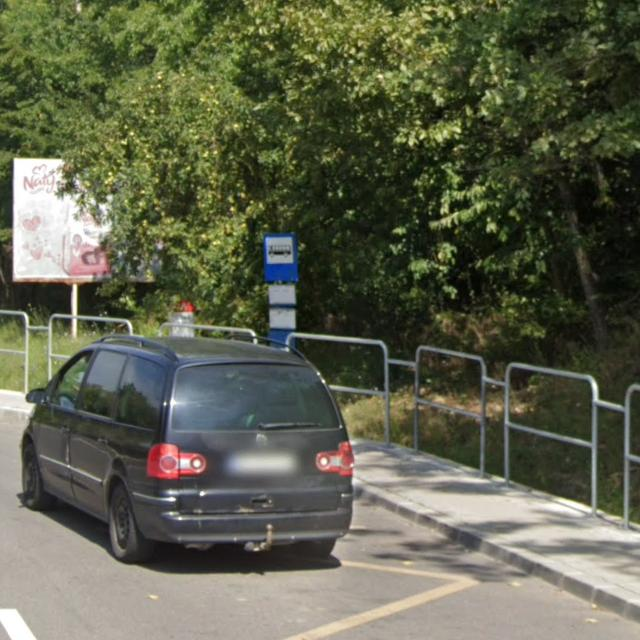

(640, 640)




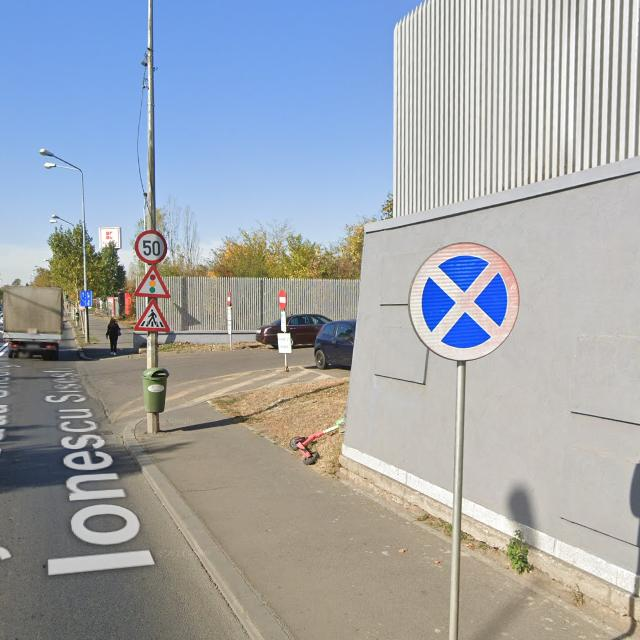

(640, 640)




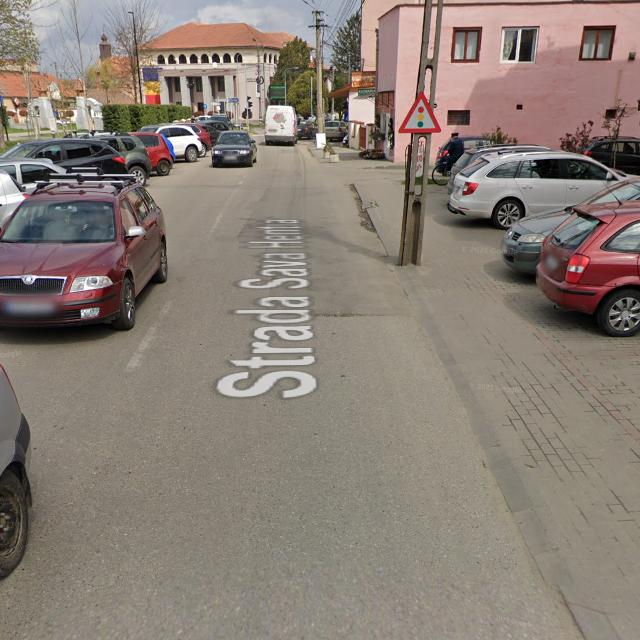

(640, 640)




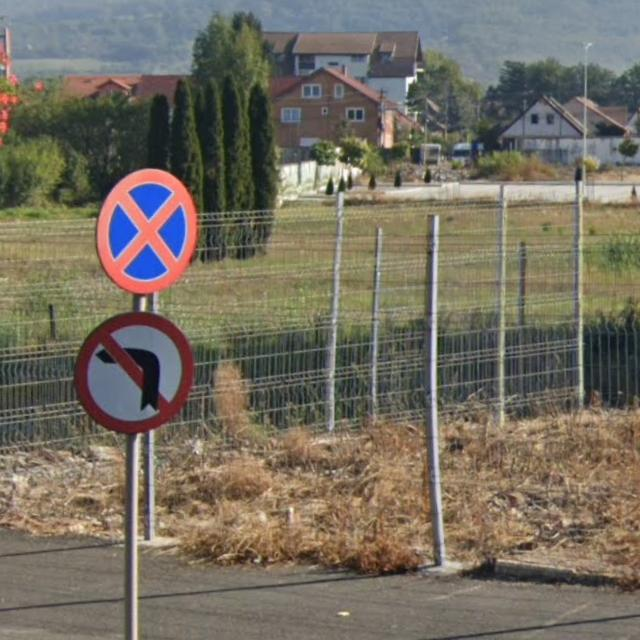

(640, 640)




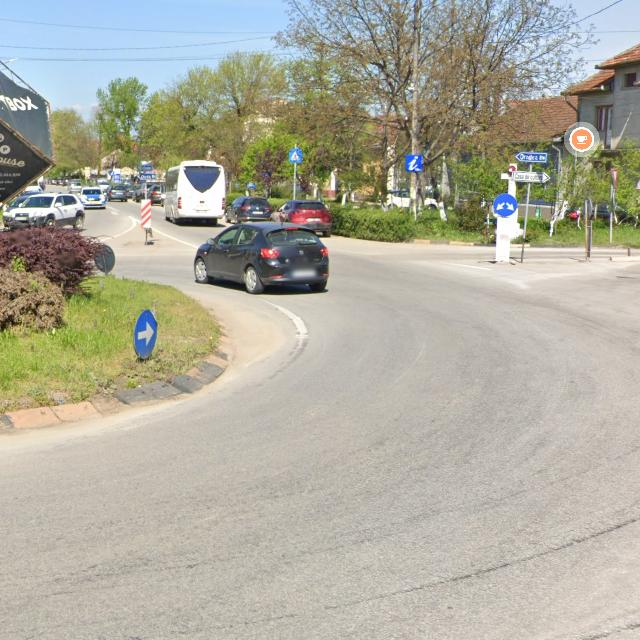

(640, 640)




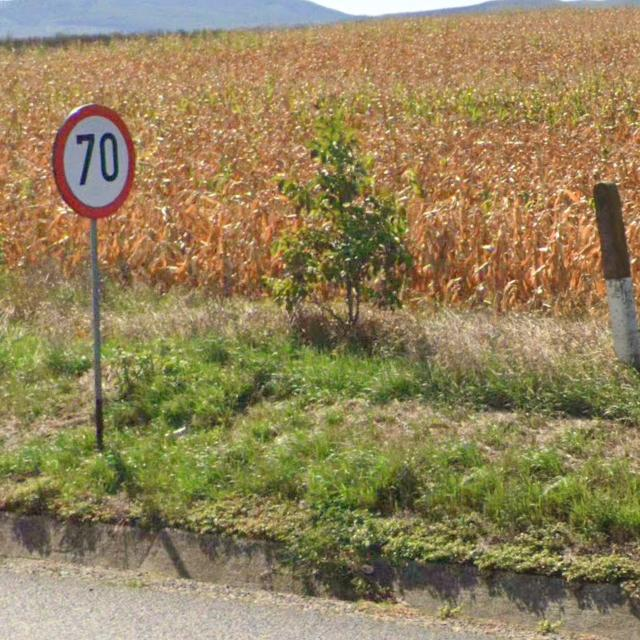

(640, 640)




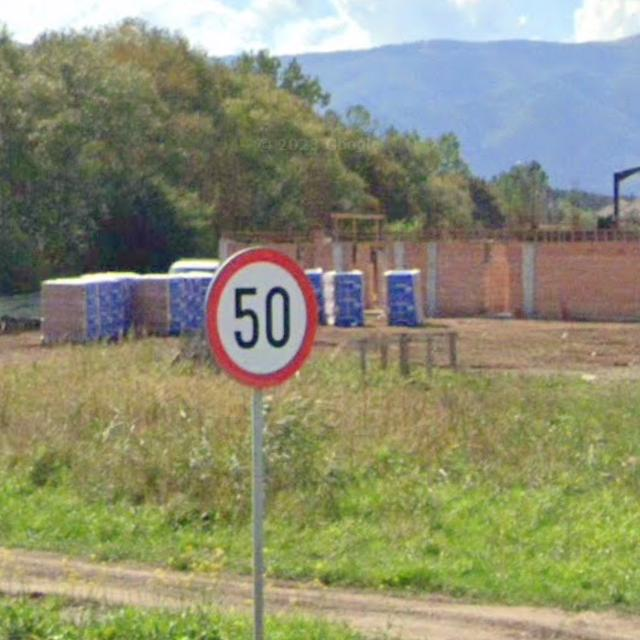

(640, 640)




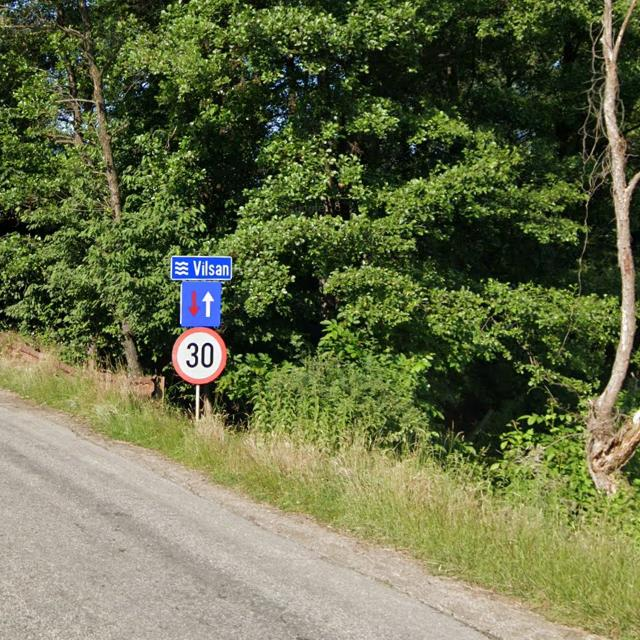

(640, 640)




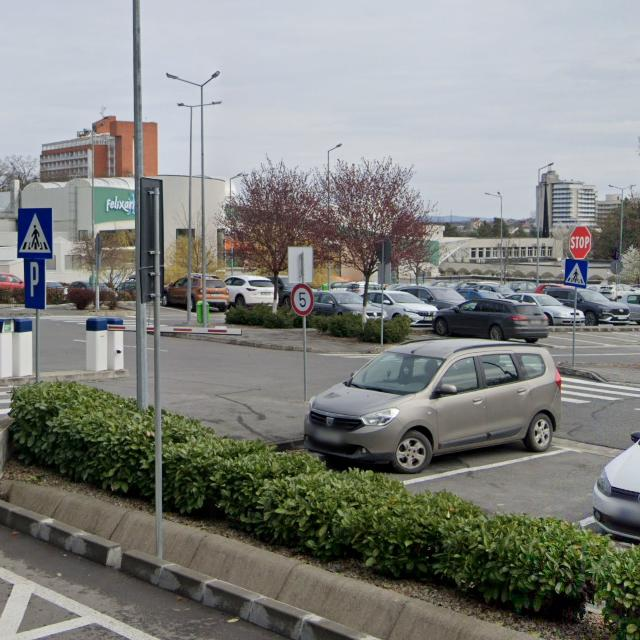

(640, 640)




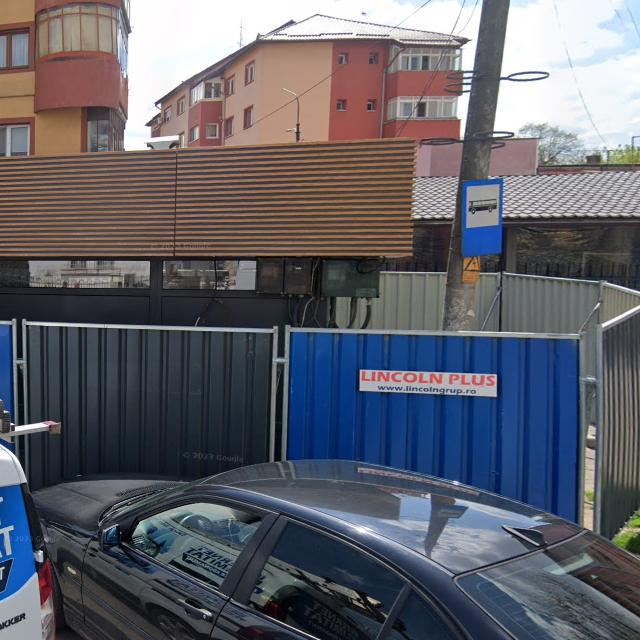

(640, 640)




In [ ]:
folder_path = "/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/train/images"
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')] #Klasördeki .jpg dosyalarını listele
selected_images = random.sample(image_files, 10) #Rasgele 10 tane görüntü seö
for image_name in selected_images:
    image_path = os.path.join(folder_path, image_name) #Görüntü dosyası yolu oluştur.
    display(Image(filename=image_path, width=600)) #Görüntüleri görselleştir.
    with PILImage.open(image_path) as img: #Görüntüyü aç ve boyutunu yazdır.
        print(img.size)
    print("\n")


**"Model eğitimi bağlantı kesildiği için yarıda kaldı, bu nedenle aşağıdaki satırda eğitime devam ediliyor. Model olarak YOLOv8m kullanıldı, 100 epoch ve 640 image size parametre olarak girildi."**

In [ ]:
%cd "/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14"
!yolo task=detect mode=train model=yolov8m.pt data="/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/data.yaml" epochs=100 imgsz=640 plots=True save=True

/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14
New https://pypi.org/project/ultralytics/8.2.35 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=Fals

**Yarıda kalan eğitimini devam ettirildi.**

In [ ]:
!yolo mode=train resume=true model=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/weights/last.pt

New https://pypi.org/project/ultralytics/8.2.35 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/weights/last.pt, data=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_co

**F1-Confidence Curve**

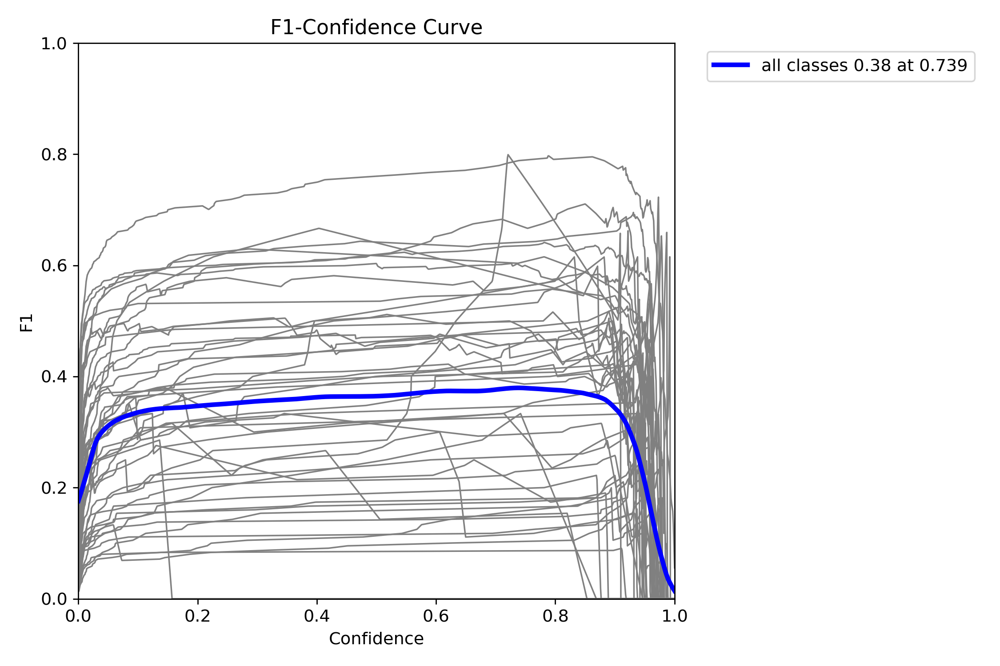

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/F1_curve.png', width=600)

**Precision-Recall Grafiği**

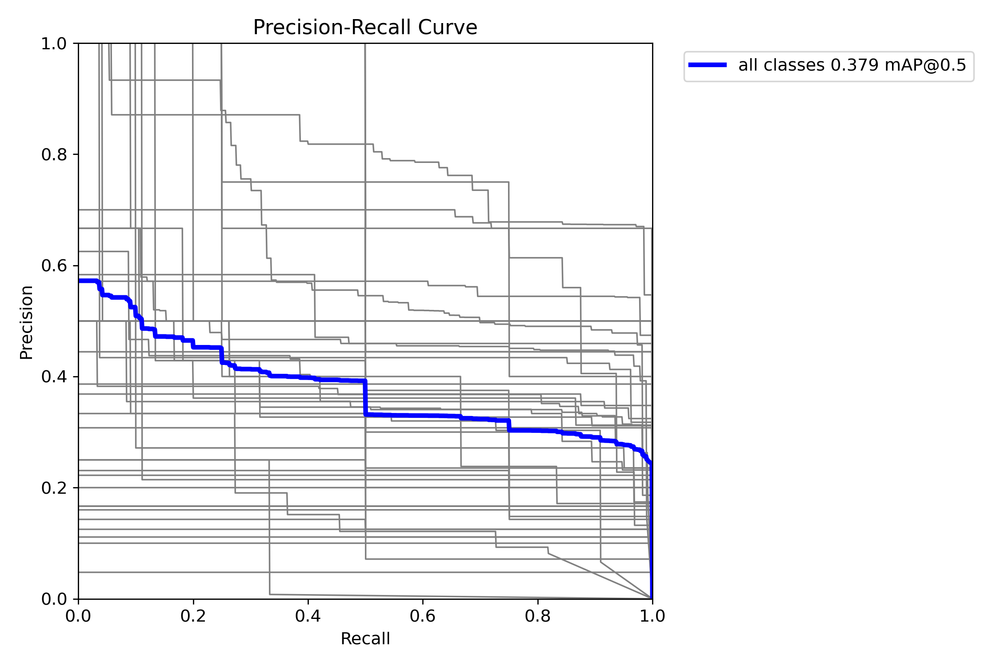

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/PR_curve.png', width=600)

**Precision-Confidence Grafiği**

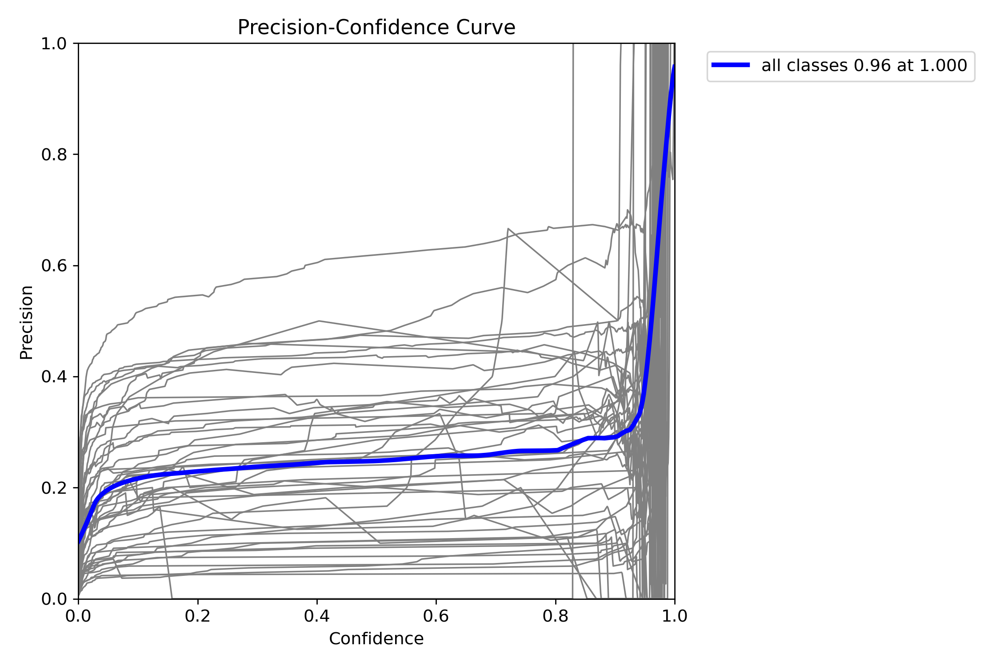

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/P_curve.png', width=600)

**Recall-Confidence Grafiği**

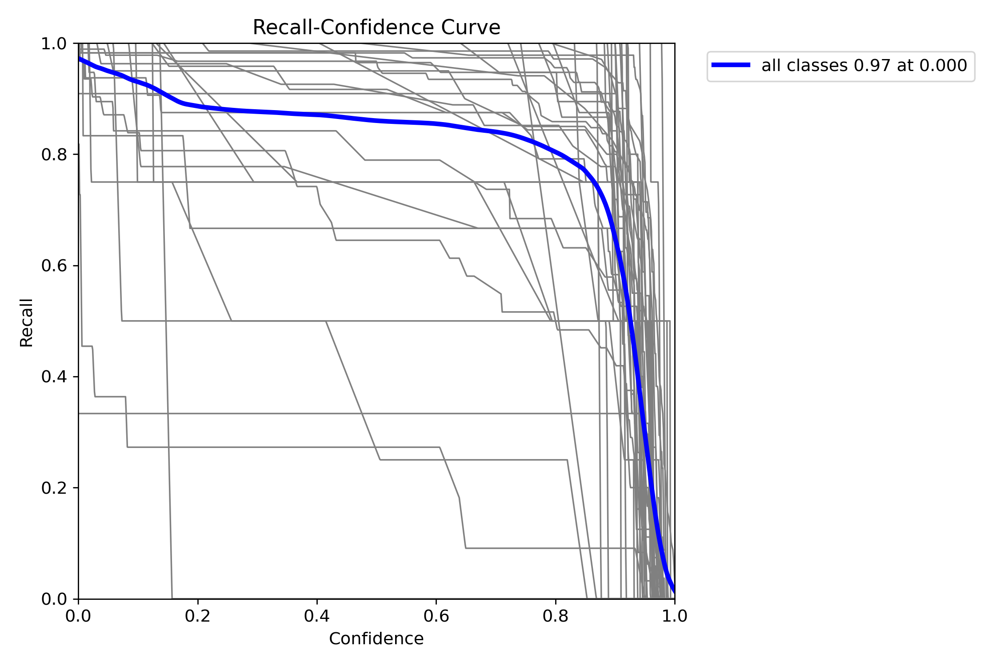

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/R_curve.png', width=600)

**Confusion Matrix Grafiği**

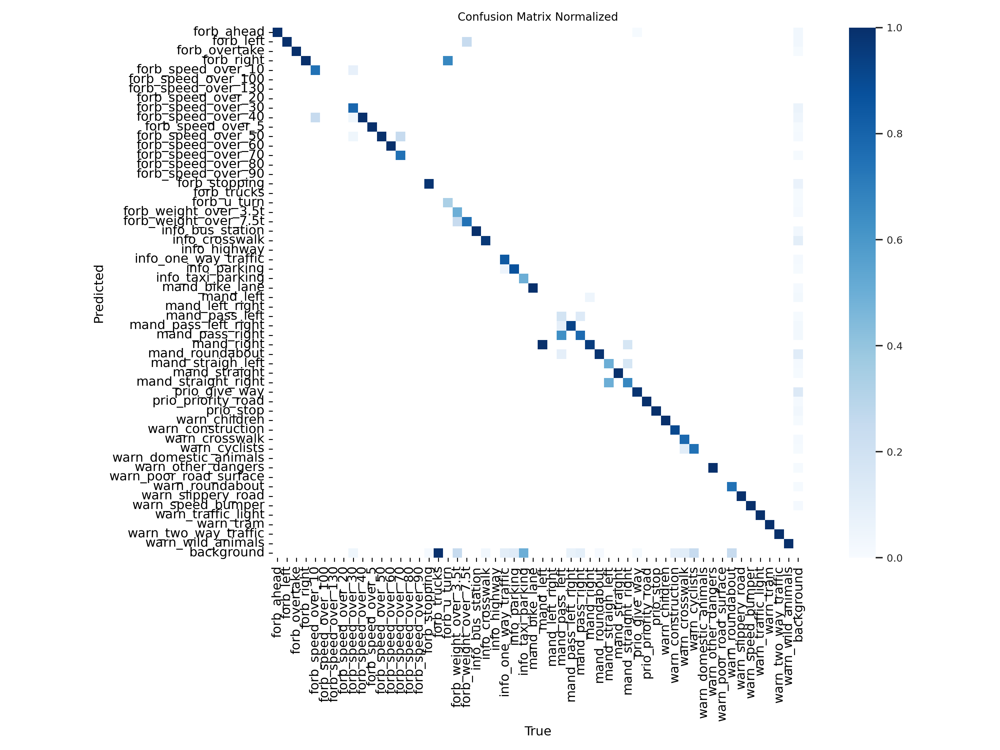

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/confusion_matrix_normalized.png', width=600)

**Etiketlerle ilgili bazı grafikler.**

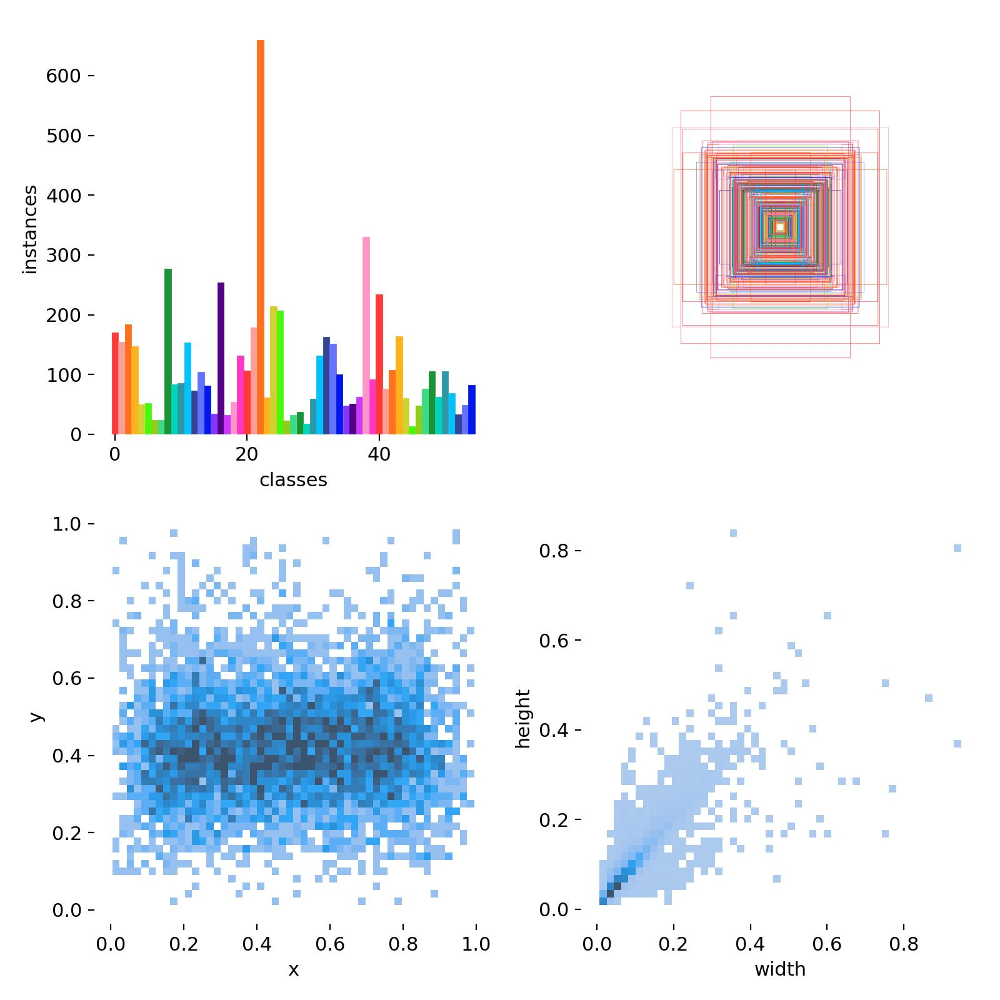

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/labels.jpg', width=600)

**Sonuç Grafikleri**

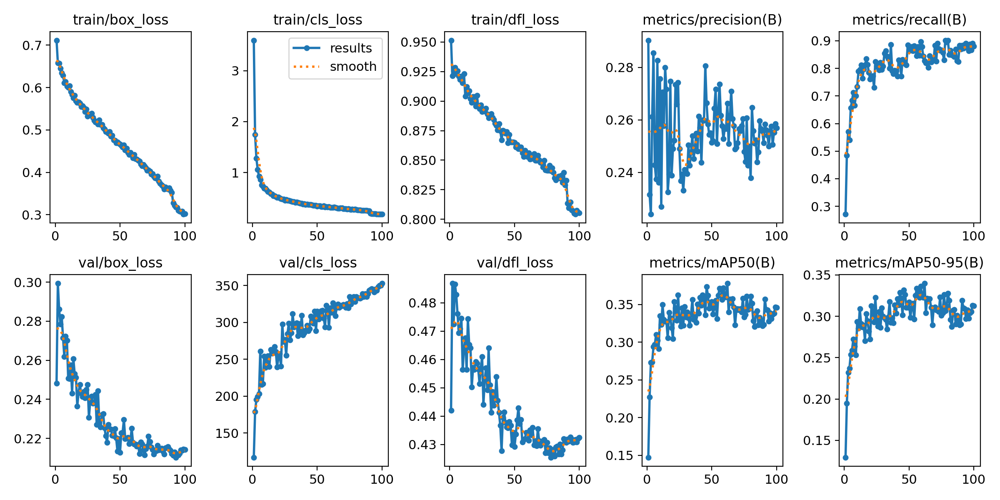

In [ ]:
Image(filename=f'/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/results.png', width=600)

**Modelin doğrulama verisi üzerindeki performansını değerlendirir ve doğrulama sonuçlarını yazdırır.**

In [ ]:
!yolo task=detect mode=val model=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/weights/best.pt data=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/data.yaml

[Errno 2] No such file or directory: '{HOME}'
/content/drive/MyDrive/TrafficSigns
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25871605 parameters, 0 gradients, 78.9 GFLOPs
100% 755k/755k [00:00<00:00, 103MB/s]
val: Scanning /content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/valid/labels.cache... 386 images, 748 backgrounds, 0 corrupt: 100% 1128/1128 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 71/71 [01:06<00:00,  1.07it/s]
                   all       1128        738      0.266      0.828      0.377       0.34
            forb_ahead       1128         19      0.305      0.947      0.375      0.346
             forb_left       1128          4       0.13          1      0.201      0.188
         forb_overtake       1128          2      0.079          1     0.0995     0.0995
            forb_right       1128         17      0

**Modelin test verisi üzerindeki obje tespiti yapılır**

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/runs/detect/train3/weights/best.pt conf=0.5 source=/content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/test/images save=True

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25871605 parameters, 0 gradients, 78.9 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/350 /content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/test/images/Screenshot-2021-10-12-at-16-12-51_png.rf.c51c5d3a0778e8b5aae564e277cd2180.jpg: 544x640 1 forb_stopping, 131.1ms
image 2/350 /content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/test/images/Screenshot-2021-10-12-at-16-13-09_png.rf.8383eb9f42269ca10bbde9eda46aaef3.jpg: 512x640 1 forb_stopping, 125.0ms
image 3/350 /content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/test/images/Screenshot-2021-10-12-at-16-13-25_png.rf.044b5b6218a342375e1ac88c40afb127.jpg: 576x640 1 forb_stopping, 71.9ms
image 4/350 /content/drive/MyDrive/TrafficSigns/Traffic-Signs-Detection-Europe-14/test/images/Screenshot-2021-10-12-at-16-13-45_png.rf.4b747fb181f25c906e5ee976d2ce4bef.jpg

**Modelin obje tespiti sonuçları rasgele biçimde görselleştirilir.**

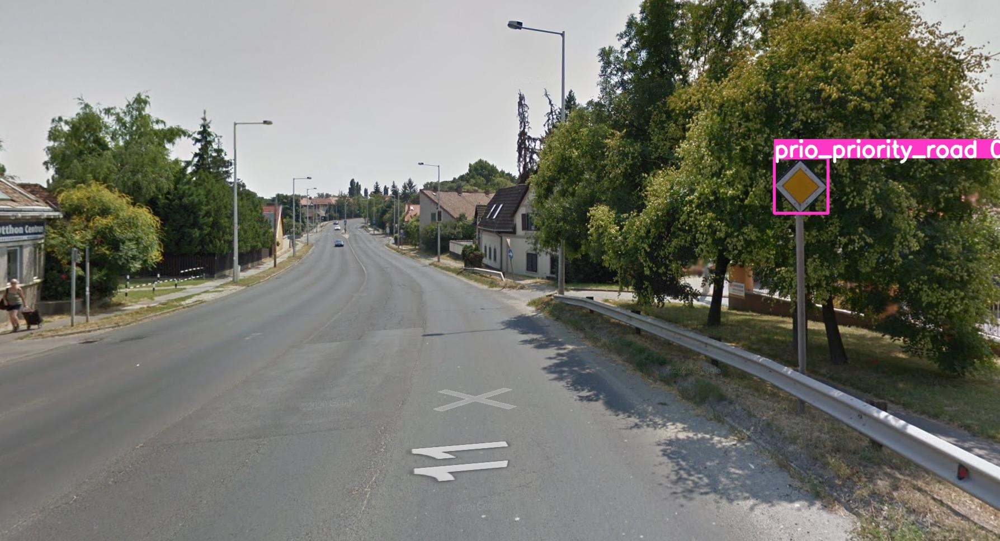

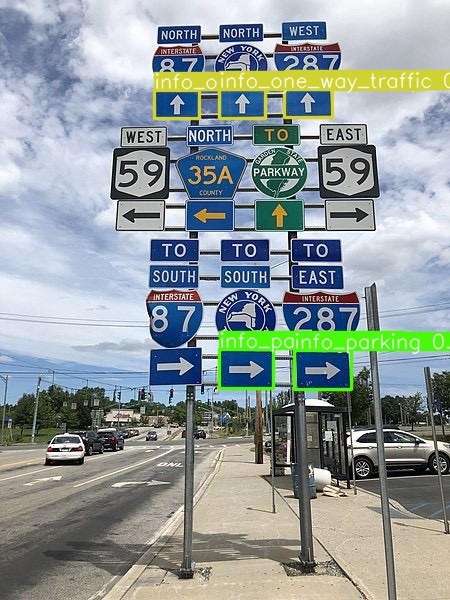

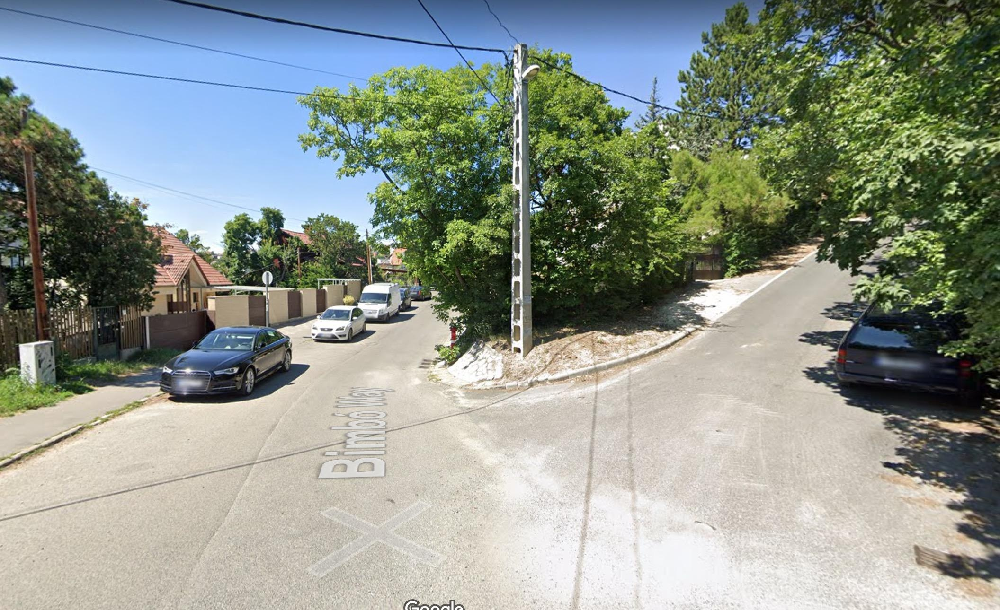

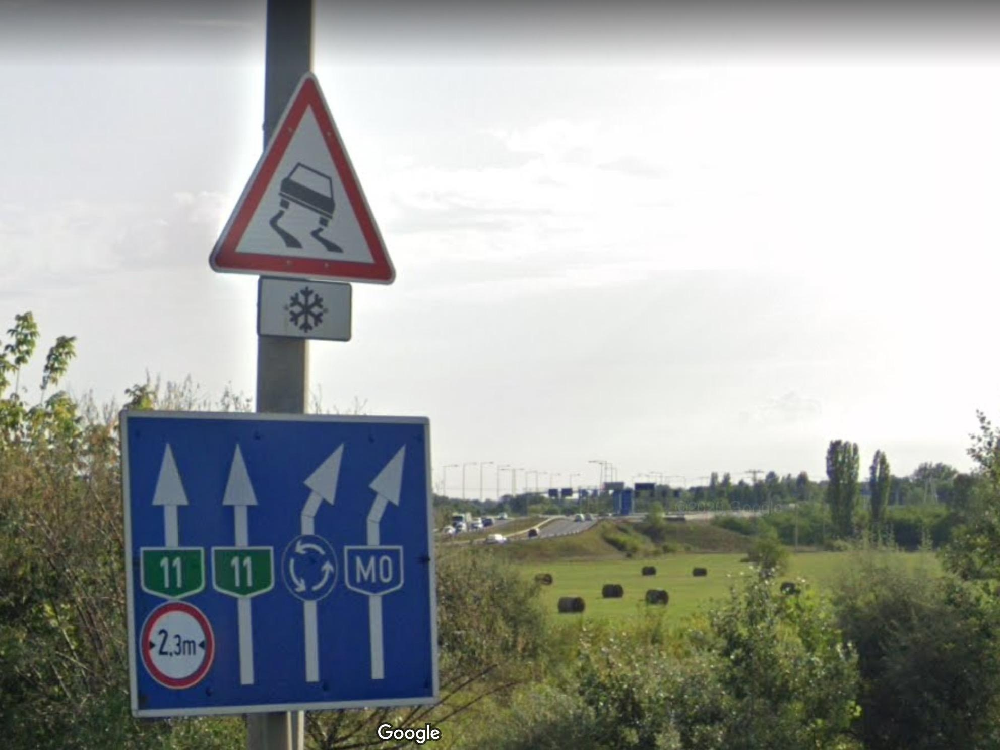

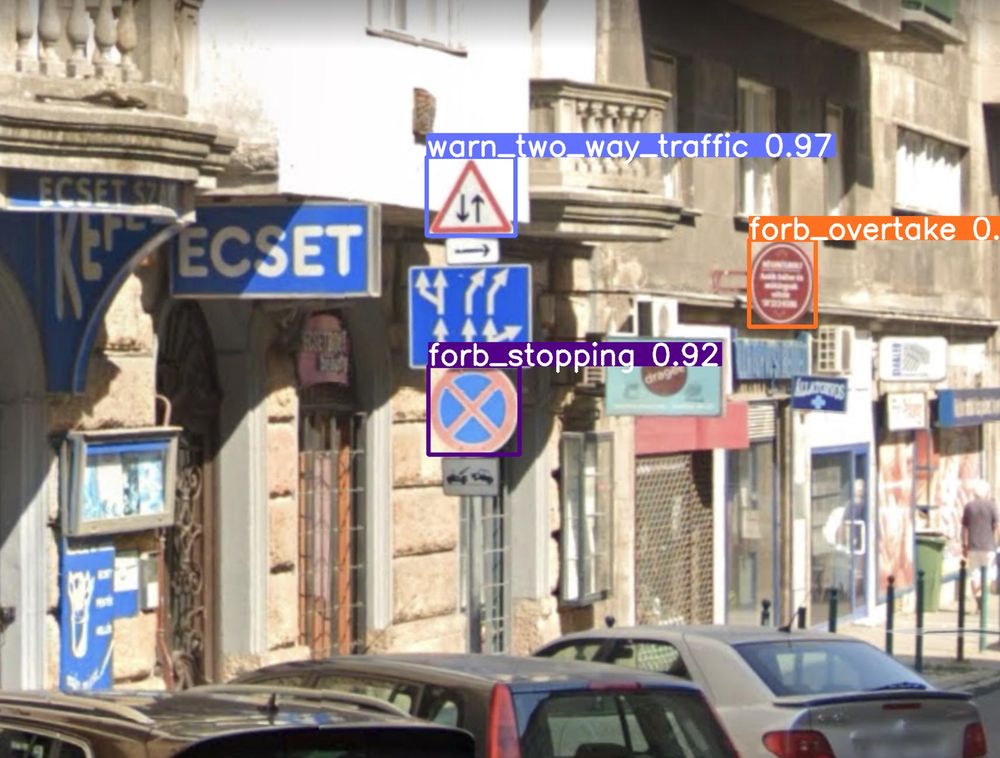

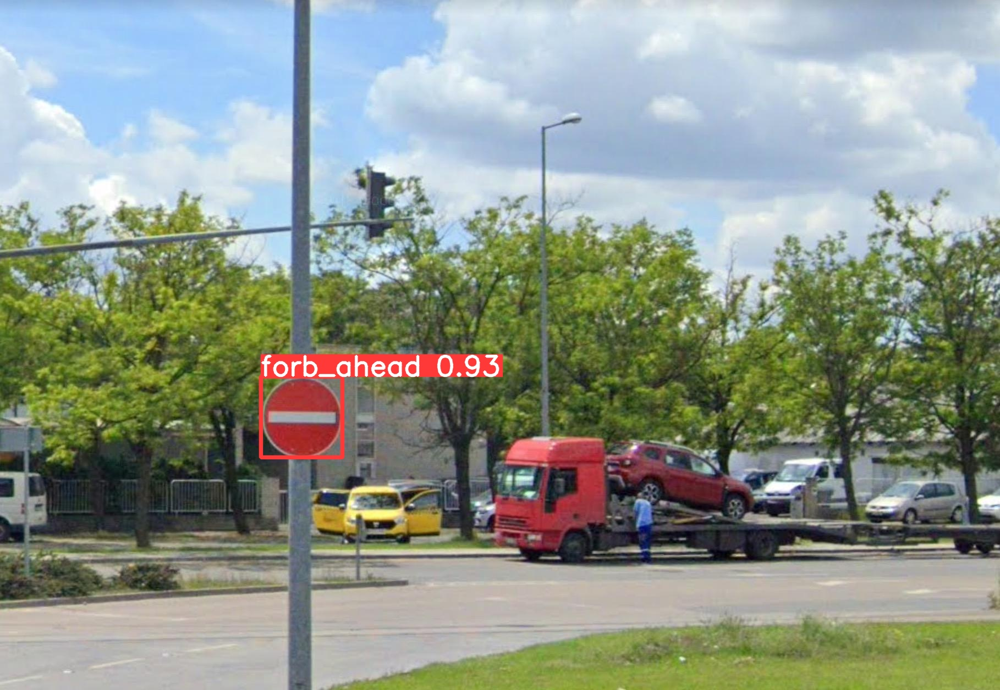

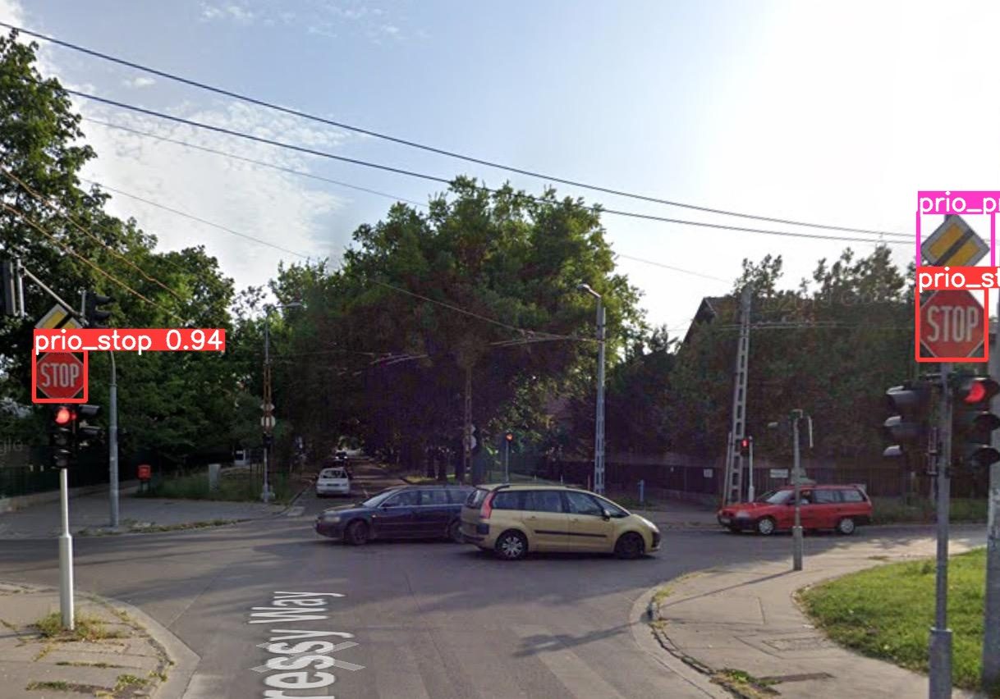

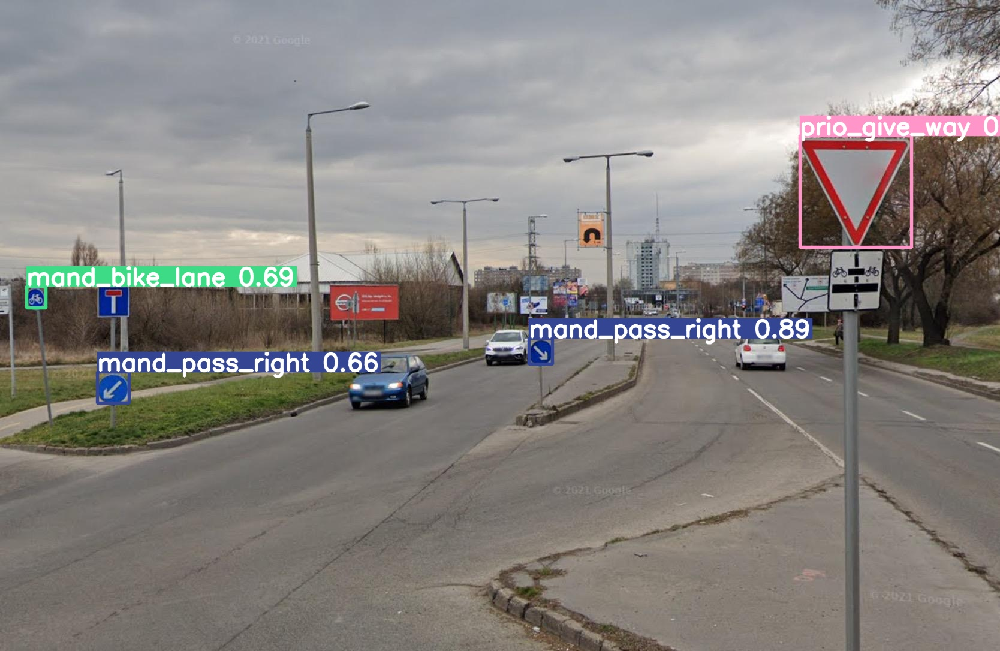

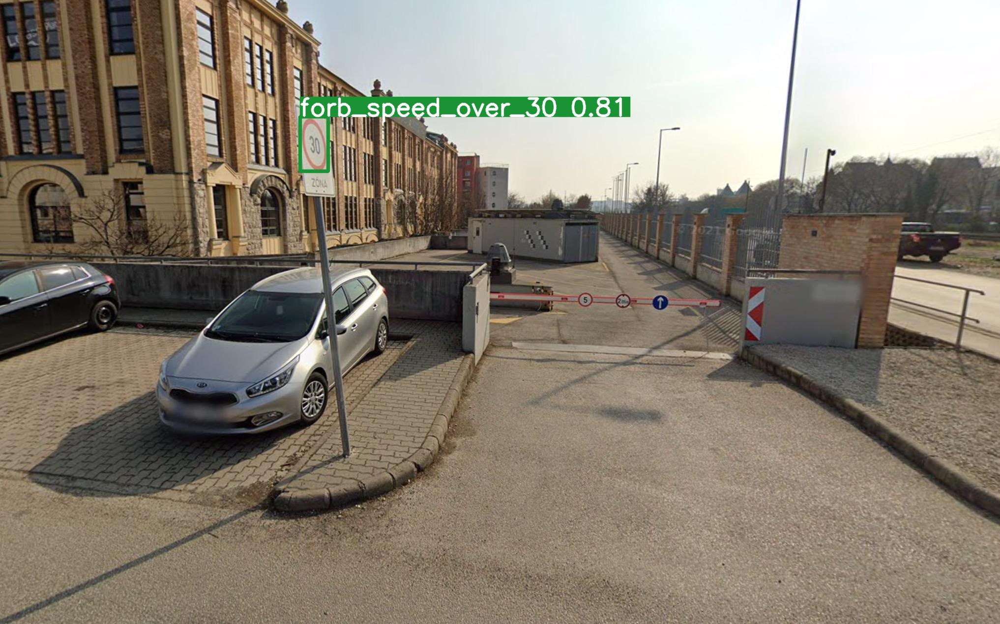

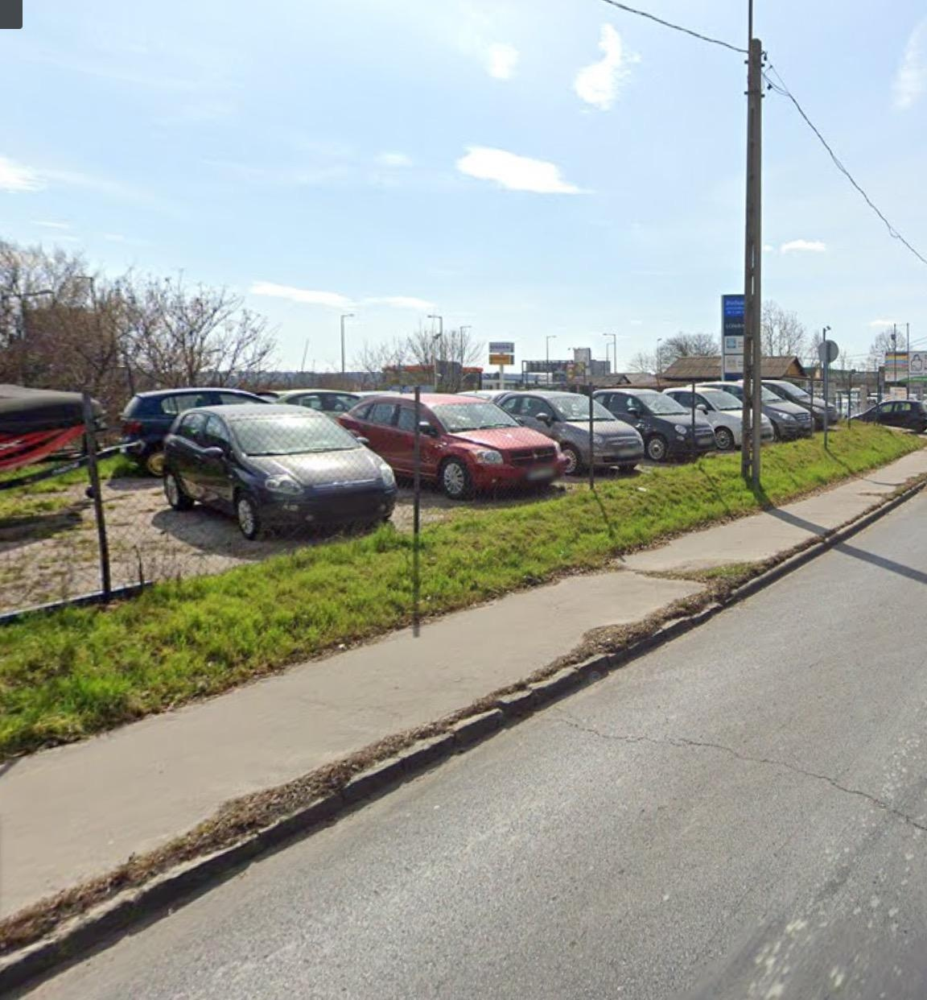

In [ ]:
folder_path = f'/content/drive/MyDrive/TrafficSigns/runs/detect/predict'
image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')] #Klasördeki .jpg dosyalarını listele
selected_images = random.sample(image_files, 10) #Rasgele 10 tane rasgele görüntü seç

for image_name in selected_images:
    image_path = os.path.join(folder_path, image_name) #Görüntü dosyası yolu oluştur.
    display(Image(filename=image_path, width=600))#Görüntüleri görselleştir.
    print("\n")